# Analisis generarl de la serie de tiempo
Se crea una rutina de reportes para poder visualizar el estado de la serie temporal, la idea es comenzar desde el analisis general de la serie hasta el analisis especifico como analisis mensual y diario.
Con esto se pretende generar una serie de metricas para determinar que metodos de intermpolacion podemos utilizar para la imputacion de datos ausentes.

In [1]:
import kaleido
import ephem
import numpy as np
import pandas as pd
from utils.utils import reshample_time_serie, categorize_precipitation
from statistics_utils.eda.timeseries import decompose_time_series
#from graphics_utils.go import arrange_figures_in_subplots


In [2]:
from api_somo import DataFetcher, fetch_qf 
import logging

# Setting up logging for the main script
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

api_url = "http://127.0.0.1:8000/database/filter-serie/"
params = {
    "station_name": "tumaco",
    "variable_name": "Precipitación acumulada",
    "processing_level_name": "Control de calidad",
    "start_date":"2010-01-01",
    "end_date":"2010-12-31"
    }

try:
    # 1. Fetch and process the data
    historical_series = DataFetcher.fetch_and_process_data(api_url, params)

    if historical_series.empty:
        raise ValueError("The historical series is empty.")

    # Additional processing with the historical series
    logger.info(f"Fetched historical series: {historical_series.head(0)}")

except Exception as e:
    logger.error(f"Error fetching historical series: {e}")

#serie_historica = reshample_time_serie(serie_historica, 'D', 'sum')
historical_series = categorize_precipitation(historical_series, params)
print(historical_series.describe())


INFO:api_somo:Sending request to http://127.0.0.1:8000/database/filter-serie/ with parameters: {'station_name': 'tumaco', 'variable_name': 'Precipitación acumulada', 'processing_level_name': 'Control de calidad', 'start_date': '2010-01-01', 'end_date': '2010-12-31'}
INFO:api_somo:Original columns: ['date_time', 'sensor_data', 'quality_flag']
INFO:api_somo:Columns after renaming: ['timestamp', 'value', 'qf']
INFO:api_somo:Timestamp conversion and indexing complete.
INFO:__main__:Fetched historical series: Empty DataFrame
Columns: [value, qf]
Index: []


              value            qf
count  52417.000000  52417.000000
mean   -3275.561123      1.262052
std    17799.878574      1.424004
min   -99999.000000      1.000000
25%        0.000000      1.000000
50%        0.000000      1.000000
75%        0.000000      1.000000
max       16.700000      9.000000


---
# Analisis de la calidad de la serie Historica
En este grafico podemos ver el total de datos agrupados por calidad en cada mes, es decir si una serie tiene 15 años tiene 15 eneros, 15 noviembres etc, con esta grafica podemos ver a modo general con cuantos datos del total contamos para la recuperacion de la serie y los datos faltantes, esta grafica es muy importante porque nos da  un marcador de calidad historico por meses, incluso aqui se puede analizar si la perdida de datos es sistematica o si tiene algun comportamiento con correlacion temporal.

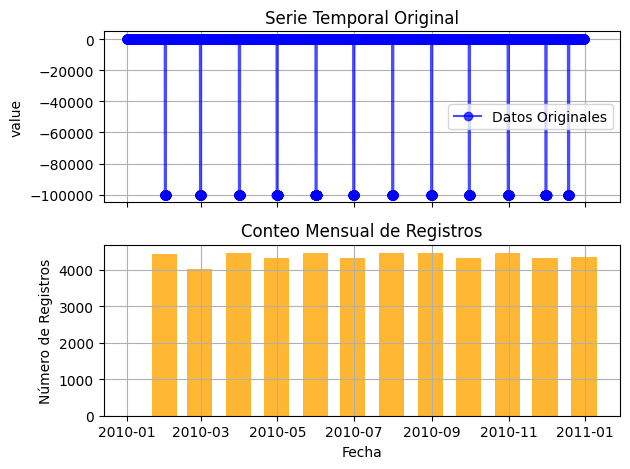

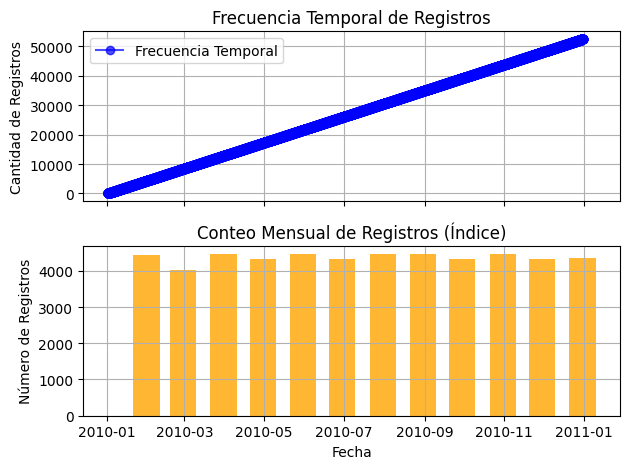

timestamp
2010-01-31 00:00:00+00:00    4434
2010-02-28 00:00:00+00:00    4032
2010-03-31 00:00:00+00:00    4464
2010-04-30 00:00:00+00:00    4320
2010-05-31 00:00:00+00:00    4464
2010-06-30 00:00:00+00:00    4320
2010-07-31 00:00:00+00:00    4464
2010-08-31 00:00:00+00:00    4464
2010-09-30 00:00:00+00:00    4320
2010-10-31 00:00:00+00:00    4464
2010-11-30 00:00:00+00:00    4320
2010-12-31 00:00:00+00:00    4351
Freq: ME, Name: timestamp, dtype: int64


In [3]:
from utils.utils import _count, analyze_time_series, analyze_time_series_index
analyze = analyze_time_series(historical_series)
report_index = analyze_time_series_index(historical_series)
print(report_index)

In [4]:
from graphics_utils.express import fig_pie_month, fig_boxplot, fig_lineplot

print(historical_series[historical_series['qf'] == 9])


line_fig = fig_lineplot(historical_series, params, color=None)
line_fig.show()
pie_fig = fig_pie_month(historical_series, params)
pie_fig.show()
boxplot_fig = fig_boxplot(historical_series, params, color='month')
boxplot_fig.show()

                             value  qf        category
timestamp                                             
2010-01-31 05:10:00+00:00 -99999.0   9  Lluvia extrema
2010-01-31 05:20:00+00:00 -99999.0   9  Lluvia extrema
2010-01-31 05:30:00+00:00 -99999.0   9  Lluvia extrema
2010-01-31 05:40:00+00:00 -99999.0   9  Lluvia extrema
2010-01-31 05:50:00+00:00 -99999.0   9  Lluvia extrema
...                            ...  ..             ...
2010-12-19 04:20:00+00:00 -99999.0   9  Lluvia extrema
2010-12-19 04:30:00+00:00 -99999.0   9  Lluvia extrema
2010-12-19 04:40:00+00:00 -99999.0   9  Lluvia extrema
2010-12-19 04:50:00+00:00 -99999.0   9  Lluvia extrema
2010-12-19 05:00:00+00:00 -99999.0   9  Lluvia extrema

[1717 rows x 3 columns]


---
## Imputación con KNN
Imputar datos faltantes utilizando los k vecinos más cercanos (k-nearest neighbors, KNN) es una técnica común y efectiva, especialmente para conjuntos de datos en los que los valores tienen una correlación espacial, temporal o de características entre ellos.

1. Preparar los datos
- Asegúrate de que los datos estén normalizados o estandarizados si las variables tienen diferentes escalas.

In [5]:
from sklearn.preprocessing import StandardScaler

# Instanciar el escalador
scaler = StandardScaler()

# Escalar solo la columna 'value'
historical_series['value'] = scaler.fit_transform(historical_series[['value']])

# Mostrar el DataFrame actualizado
print(historical_series)



                              value  qf    category     month  year
timestamp                                                          
2010-01-01 05:00:00+00:00  0.184023   1  Sin lluvia   January  2010
2010-01-01 05:10:00+00:00  0.184023   1  Sin lluvia   January  2010
2010-01-01 05:20:00+00:00  0.184023   1  Sin lluvia   January  2010
2010-01-01 05:30:00+00:00  0.184023   1  Sin lluvia   January  2010
2010-01-01 05:40:00+00:00  0.184023   1  Sin lluvia   January  2010
...                             ...  ..         ...       ...   ...
2010-12-31 04:20:00+00:00  0.184023   1  Sin lluvia  December  2010
2010-12-31 04:30:00+00:00  0.184023   1  Sin lluvia  December  2010
2010-12-31 04:40:00+00:00  0.184023   1  Sin lluvia  December  2010
2010-12-31 04:50:00+00:00  0.184023   1  Sin lluvia  December  2010
2010-12-31 05:00:00+00:00  0.184023   1  Sin lluvia  December  2010

[52417 rows x 5 columns]


In [6]:
historical_series.loc[historical_series['qf'] != 1, 'value'] = np.nan

from sklearn.impute import KNNImputer

# Configurar el imputador con KNN
imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')

# Realizar la imputación solo en la columna 'values' y mantener el índice 'timestamp'
serie_historica_impitada=historical_series.copy()
serie_historica_impitada['value'] = imputer.fit_transform(historical_series[['value']])
print("correlacion de la serie imputada respecto a la original: ",serie_historica_impitada['value'].corr(historical_series['value']))
from graphics_utils.go import multi_line
fig = multi_line(CCCP=historical_series['value'], Imputadas=serie_historica_impitada['value'])
fig.show()


correlacion de la serie imputada respecto a la original:  1.0


# Descomponer la serie temporal
Esta seccion se crea para hacer el procesamiento de descomposicion

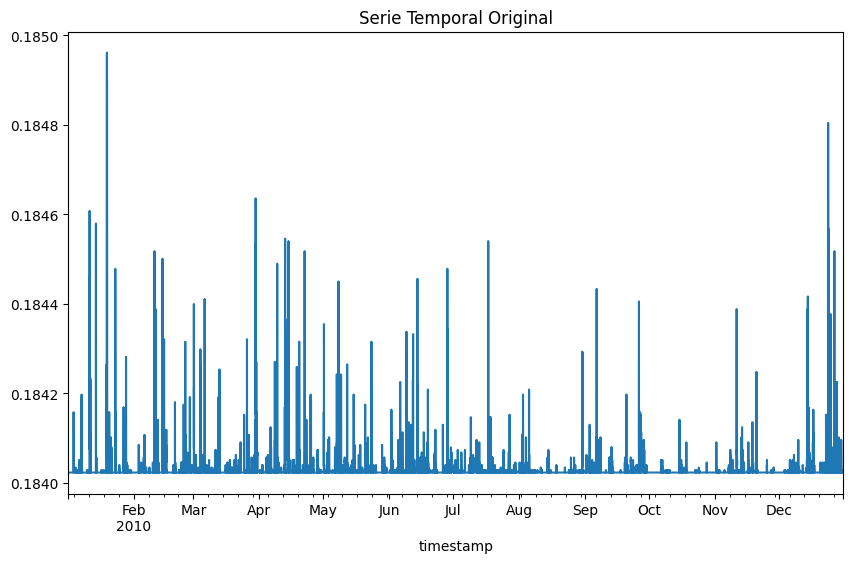

Estadístico ADF: -31.52849958487326
p-valor ADF: 0.0


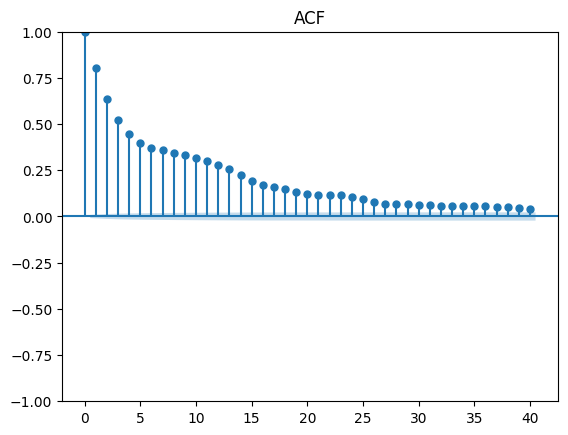

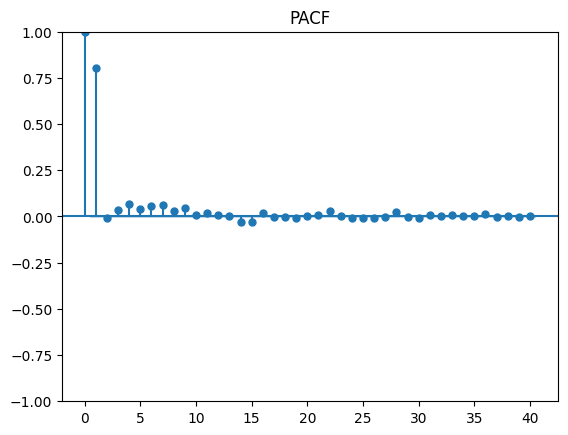

d:\master BigData\01 proyecto final\codigos\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency 10min will be used.

d:\master BigData\01 proyecto final\codigos\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency 10min will be used.



                                     SARIMAX Results                                      
Dep. Variable:                              value   No. Observations:                52417
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood              474917.593
Date:                            Sat, 11 Jan 2025   AIC                        -949825.186
Time:                                    11:55:59   BIC                        -949780.854
Sample:                                01-01-2010   HQIC                       -949811.329
                                     - 12-31-2010                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9759   1.86e-20   5.26e+19      0.000       0.976       0.976
ma.L1         -1.1172   2.39e-20  -

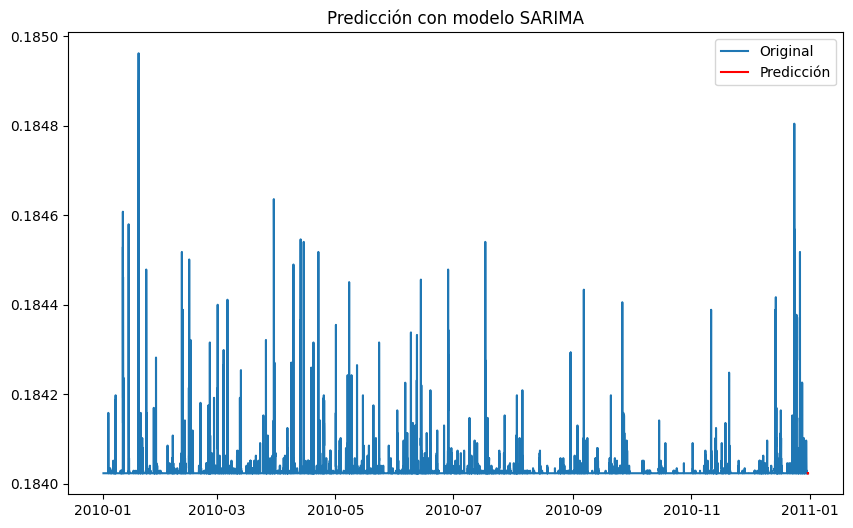

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error

# Cargar los datos (asegúrate de que tus datos sean una serie temporal con un índice temporal)
# Aquí, asumo que tienes una columna llamada 'value' con los datos temporales
#historical_series = pd.read_csv('datos.csv', parse_dates=['fecha'], index_col='fecha')

# Visualizar la serie temporal para identificar tendencias y estacionalidad
historical_series['value'].plot(figsize=(10,6))
plt.title('Serie Temporal Original')
plt.show()

# **Paso 1: Verificar estacionariedad (prueba de Dickey-Fuller)**
adf_result = adfuller(historical_series['value'].dropna())
print(f'Estadístico ADF: {adf_result[0]}')
print(f'p-valor ADF: {adf_result[1]}')

# Si p-valor < 0.05, la serie es estacionaria. Si no, hay que diferenciarla.

# **Paso 2: ACF y PACF para determinar p, q (No Estacional)**
plot_acf(historical_series['value'].dropna(), lags=40)
plt.title('ACF')
plt.show()

plot_pacf(historical_series['value'].dropna(), lags=40)
plt.title('PACF')
plt.show()

# **Paso 3: ACF y PACF para determinar P, Q (Estacional)**
# Visualiza los ACF y PACF estacionales observando los retardos múltiplos de 's' (por ejemplo, s=12 para datos mensuales).
# Si es estacionalidad anual, puedes hacer ACF y PACF para retrasos 12, 24, 36, etc.

# **Paso 4: Construcción y ajuste del modelo SARIMA**
# En este caso, elegimos los parámetros (p, d, q) y (P, D, Q, s) basado en ACF, PACF, y el análisis de estacionalidad

# Usamos los parámetros (p, d, q) = (1, 1, 1) y (P, D, Q) = (1, 1, 1) con un ciclo estacional de s=12
modelo_sarima = SARIMAX(historical_series['value'], 
                       order=(1, 1, 1), 
                       seasonal_order=(1, 1, 1, 12),  # Estacionalidad anual (s=12)
                       enforce_stationarity=False,
                       enforce_invertibility=False)

# Ajustar el modelo
resultado = modelo_sarima.fit(disp=False)

# Ver el resumen del modelo ajustado
print(resultado.summary())

# **Paso 5: Predicción y evaluación**
# Realizar predicciones en el conjunto de validación
predicciones = resultado.predict(start=historical_series.index[-20], end=historical_series.index[-1], dynamic=False)

# Evaluar el rendimiento con el error cuadrático medio
mse = mean_squared_error(historical_series['value'][-20:], predicciones)
print(f'Mean Squared Error: {mse}')

# Visualizar las predicciones
plt.figure(figsize=(10,6))
plt.plot(historical_series['value'], label='Original')
plt.plot(predicciones, label='Predicción', color='red')
plt.title('Predicción con modelo SARIMA')
plt.legend()
plt.show()
